In [1]:
import numpy as np
import pandas as pd
import sys
sys.path.insert(20, '/home/nicolas/anaconda2/lib/python2.7/site-packages')
import datashader as ds
import datashader.transfer_functions as tf

In [2]:
data = pd.read_csv("./asm_data_for_ml.txt", sep='\t')
data_plot = pd.DataFrame({'x':data['rateC'] / data['rateA'], 'y':data['rate']})
data['rateCA'] = data.rateC / data.rateA
data['rateCB'] = data.rateC / data.rateB
data['rateBA'] = data.rateB / data.rateA

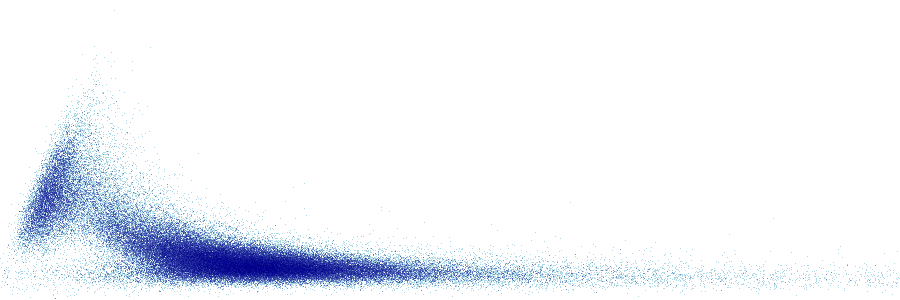

In [3]:
cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count())

aa = tf.interpolate(agg)
#tf.stack(aa, tf.interpolate(cvs.points(data, 'rateBA', 'rate'), cmap=['red']))
aa

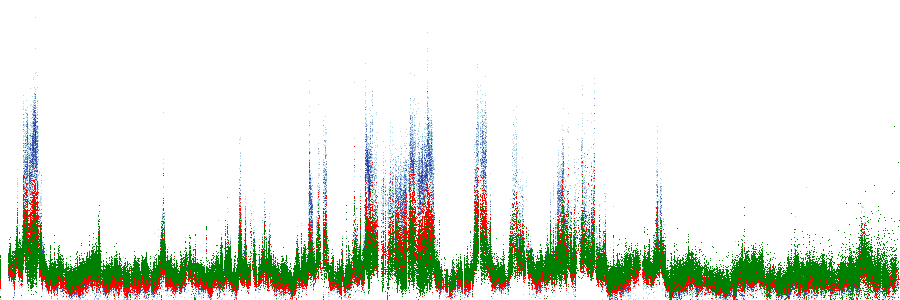

In [4]:
cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[data.MJD.min(), data.MJD.max()], y_range=[0, 100])
imgs = [tf.interpolate(cvs.points(data, 'MJD', 'rateA')),
       tf.interpolate(cvs.points(data, 'MJD', 'rateB'), cmap=['red']),
       tf.interpolate(cvs.points(data, 'MJD', 'rateC'), cmap=['green'])]
tf.stack(*imgs)


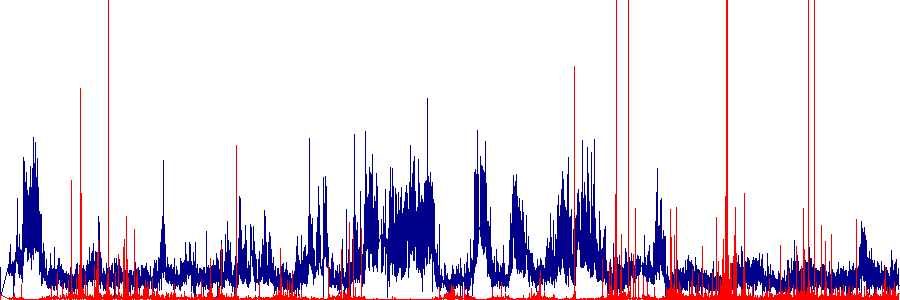

In [5]:
cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[data.MJD.min(), data.MJD.max()], y_range=[0, 300])

imgs = [tf.interpolate(cvs.line(data, 'MJD', 'rate')),
        tf.interpolate(cvs.line(data, 'MJD', 'rateCA'), cmap=['red'])]
tf.stack(*imgs)

#tf.interpolate(cvs.line(data, 'MJD', 'rateCA'), cmap=['red'])

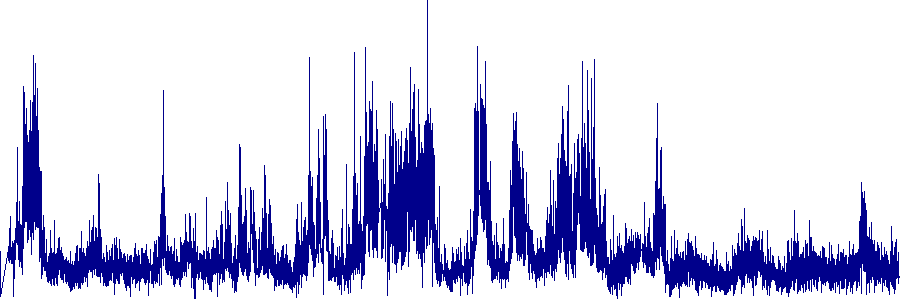

In [6]:
cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[data.MJD.min(), data.MJD.max()], y_range=[0, 200])
tf.interpolate(cvs.line(data, 'MJD', 'rate'))

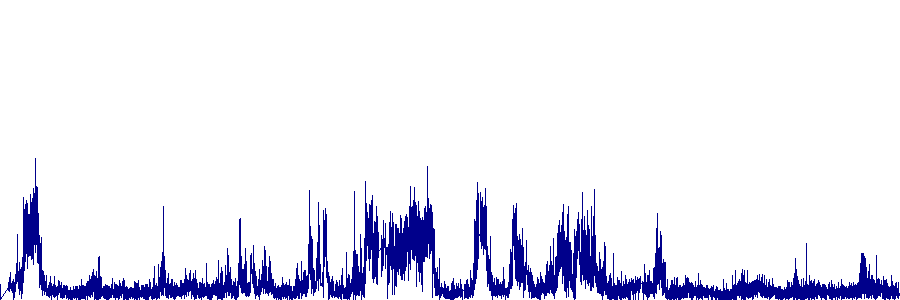

In [7]:
tf.interpolate(cvs.line(data, 'MJD', 'rateA'))

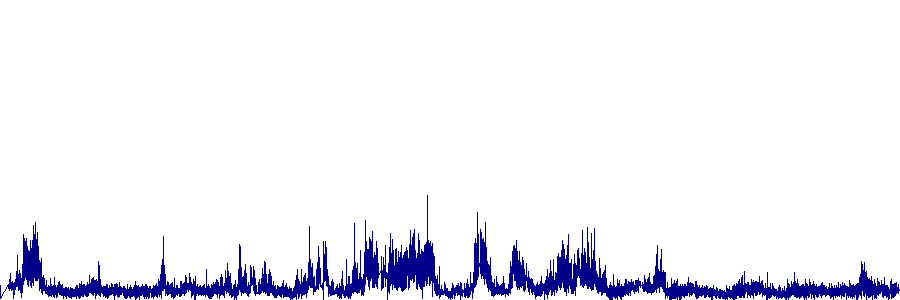

In [8]:
tf.interpolate(cvs.line(data, 'MJD', 'rateB'))

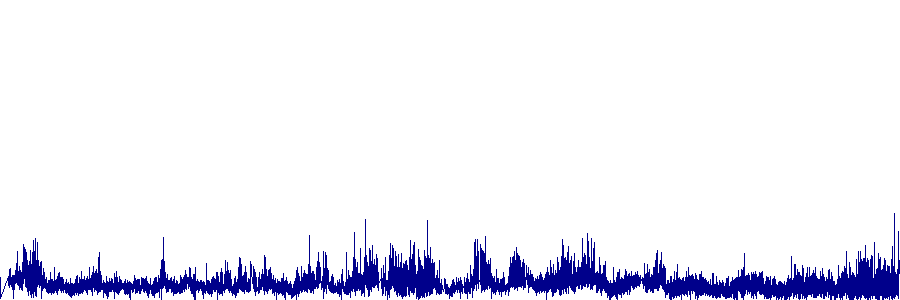

In [9]:
tf.interpolate(cvs.line(data, 'MJD', 'rateC'))

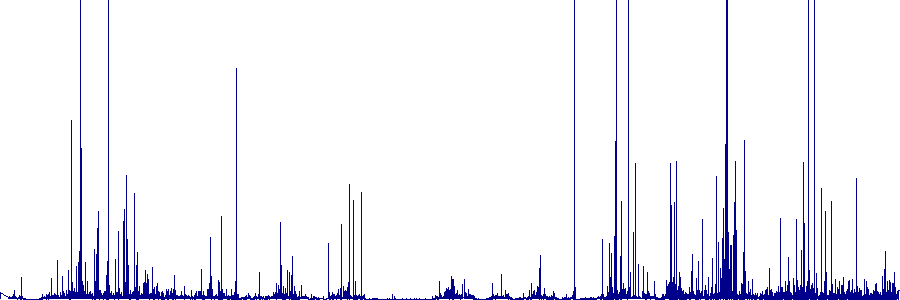

In [10]:
tf.interpolate(cvs.line(data, 'MJD', 'rateCA'))

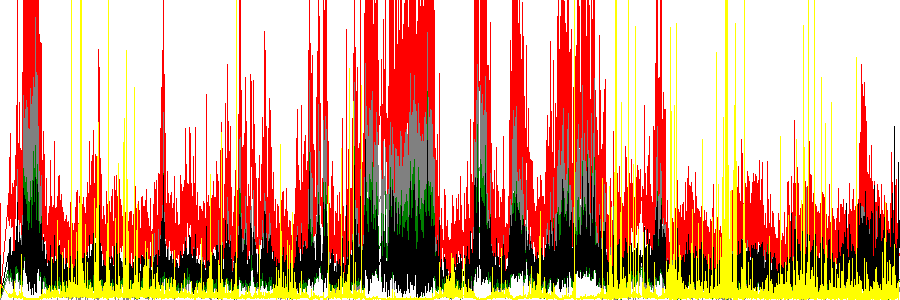

In [11]:
from collections import OrderedDict
colors = ["red", "grey", 'green', "black", 'yellow']
          
cols = ['rate', 'rateA', 'rateB', 'rateC', 'rateCA']

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[data.MJD.min(), data.MJD.max()], y_range=[0, 100])
aggs= OrderedDict((c, cvs.line(data, 'MJD', c)) for c in cols)

imgs = [tf.interpolate(aggs[i], cmap=[c]) for i, c in zip(cols, colors)]
tf.stack(*imgs)

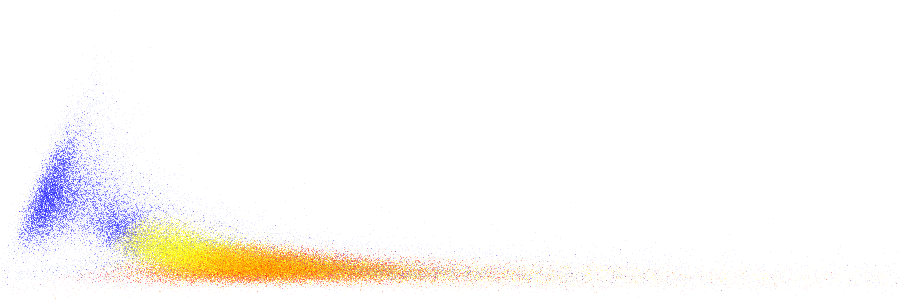

In [12]:
# GMM with 3 components:
from sklearn.mixture import GaussianMixture
np.random.seed(0)

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate]

gmm = GaussianMixture(n_components=3, n_init=5).fit(X)
preds = gmm.predict(X)
probs = gmm.predict_proba(X)

data['preds'] = pd.Series(preds).astype("category")
color_key = ['red', 'blue', 'yellow']

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)

<IPython.core.display.Javascript object>


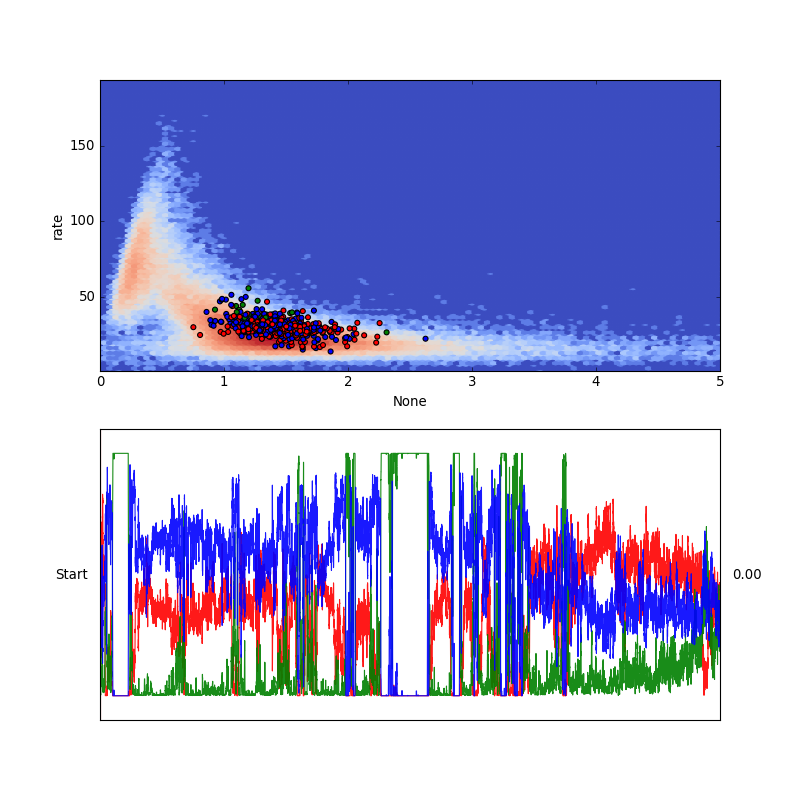

In [13]:
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, Button, RadioButtons
from matplotlib.colors import ListedColormap
%matplotlib notebook

delta = 10
window = 100
cm = ListedColormap(['r', 'g', 'b'])

fig, axes = plt.subplots(2, 1, figsize=(10, 10))

ax = axes[0]
tmp = data.rateC / data.rateA
ind = (tmp < 5) & (data.rate<200)
cola = tmp[ind]
colb = data.rate[ind]

chunks = float(len(cola)) / delta

ax.hexbin(cola, colb, cmap='coolwarm', bins='log') #cmap='viridis'
ax.set_xlabel('rateC/rateA')
ax.set_ylabel('rate')

#cola, colb, color = mask(cola, colb, p1=99, p2=99.99)
l = ax.scatter(cola[:5 * window], colb[:5 * window], c=preds[:5 * window], alpha=1, s=20, cmap=cm)
ax.set_xlabel(cola.name)
ax.set_ylabel(colb.name)

# axfreq = plt.axes([0.1, 0.0, 0.8, 0.03])
sfreq = Slider(axes[1], 'Start', 0, len(cola), valinit=0, facecolor=None, alpha=.1)
for prob, color in zip(probs.T, ['r', 'g', 'b']):
    axes[1].plot(pd.Series(prob).rolling(window=50).mean(), color=color, alpha=.9, linewidth=1)

def update(val):
    start = int(sfreq.val)
    inds = range(start, start + window)
    l.set_offsets(np.c_[cola.iloc[inds], colb.iloc[inds]])
    l.set_array(preds[inds])
    plt.gcf().canvas.draw_idle()
sfreq.on_changed(update)

#ax.set_xlim(cola.min(), cola.max())
ax.set_xlim(0, 5)
ax.set_ylim(colb.min(), colb.max())

axes[1].set_ylim(-0.1, 1.1)
plt.show()

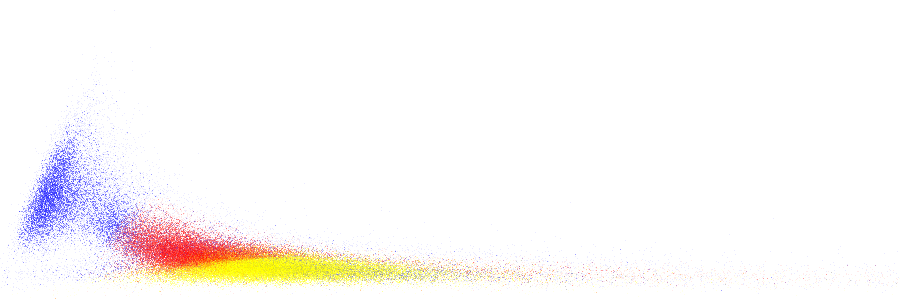

In [14]:
# idem with preprocessing with iforest:
from sklearn.ensemble import IsolationForest
np.random.seed(0)

IF = IsolationForest(n_estimators=100).fit(X)
ano_score = IF.decision_function(X)
X_in = X[ano_score>-0.05]

gmm = GaussianMixture(n_components=3, n_init=5).fit(X_in)
preds = gmm.predict(X)

data['preds'] = pd.Series(preds).astype("category")
color_key = ['red', 'blue', 'yellow']

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)

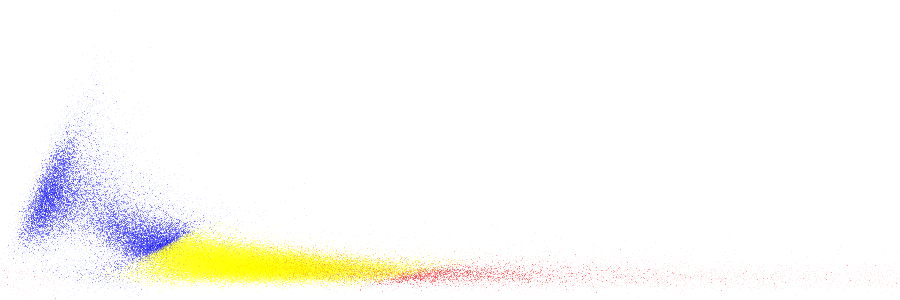

In [15]:
# GMM with 3 components with data X containing rateC/rateA:
np.random.seed(0)

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate, data.rateCA]

gmm = GaussianMixture(n_components=3, n_init=5).fit(X)
preds = gmm.predict(X)
probs = gmm.predict_proba(X)

data['preds'] = pd.Series(preds).astype("category")
color_key = ['red', 'blue', 'yellow']

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)

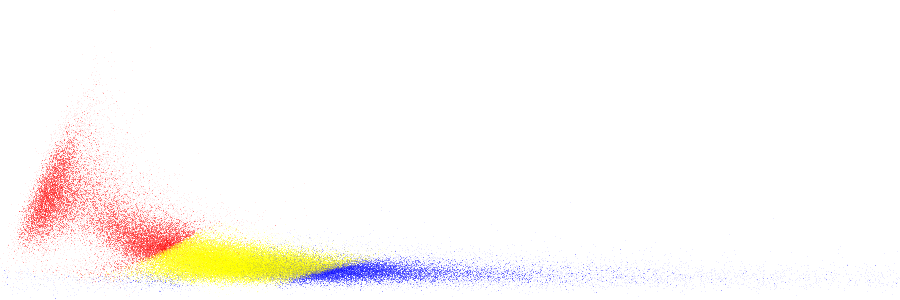

In [16]:
# idem with preprocessing with iforest:
np.random.seed(0)
IF = IsolationForest(n_estimators=100).fit(X)
ano_score = IF.decision_function(X)
X_in = X[ano_score>-0.05]

gmm = GaussianMixture(n_components=3, n_init=5).fit(X_in)
preds = gmm.predict(X)
probs = gmm.predict_proba(X)

data['preds'] = pd.Series(preds).astype("category")
color_key = ['red', 'blue', 'yellow']

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)

<IPython.core.display.Javascript object>


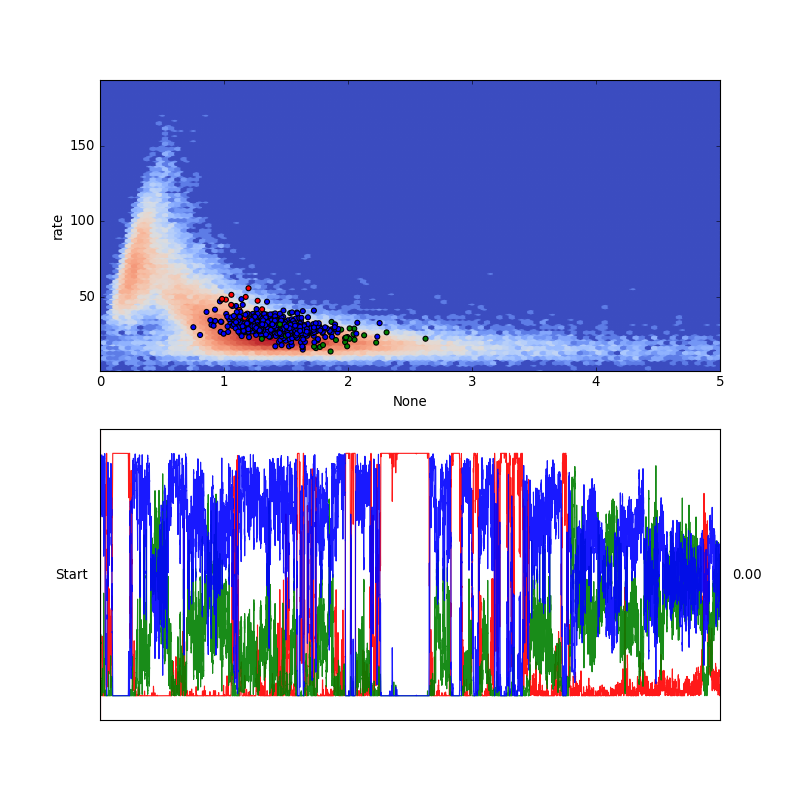

In [17]:
delta = 10
window = 100
cm = ListedColormap(['r', 'g', 'b'])

fig, axes = plt.subplots(2, 1, figsize=(10, 10))

ax = axes[0]
tmp = data.rateC / data.rateA
ind = (tmp < 5) & (data.rate<200)
cola = tmp[ind]
colb = data.rate[ind]

chunks = float(len(cola)) / delta

ax.hexbin(cola, colb, cmap='coolwarm', bins='log') #cmap='viridis'
ax.set_xlabel('rateC/rateA')
ax.set_ylabel('rate')

#cola, colb, color = mask(cola, colb, p1=99, p2=99.99)
l = ax.scatter(cola[:5 * window], colb[:5 * window], c=preds[:5 * window], alpha=1, s=20, cmap=cm)
ax.set_xlabel(cola.name)
ax.set_ylabel(colb.name)

# axfreq = plt.axes([0.1, 0.0, 0.8, 0.03])
sfreq = Slider(axes[1], 'Start', 0, len(cola), valinit=0, facecolor=None, alpha=.1)
for prob, color in zip(probs.T, ['r', 'g', 'b']):
    axes[1].plot(pd.Series(prob).rolling(window=50).mean(), color=color, alpha=.9, linewidth=1)

def update(val):
    start = int(sfreq.val)
    inds = range(start, start + window)
    l.set_offsets(np.c_[cola.iloc[inds], colb.iloc[inds]])
    l.set_array(preds[inds])
    plt.gcf().canvas.draw_idle()
sfreq.on_changed(update)

#ax.set_xlim(cola.min(), cola.max())
ax.set_xlim(0, 5)
ax.set_ylim(colb.min(), colb.max())

axes[1].set_ylim(-0.1, 1.1)
plt.show()

In [18]:
# gmm model selection with bic:

from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Spectral7
output_notebook()

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate, data.rateCA]

lowest_bic = np.infty
bic = []
n_components_range = range(1, 7)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a mixture of Gaussians with EM
        gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm
print best_gmm.covariance_type, best_gmm.n_components

preds = best_gmm.predict(X)
probs = best_gmm.predict_proba(X)

colors = [Spectral7[x] for x in preds]

p = figure(title = 'best_gmm', x_range=[0, 5])
p.circle(data.rateCA, data.rate, color=colors, radius=0.02)

show(p)

Loading BokehJS ...

full 6


<IPython.core.display.Javascript object>


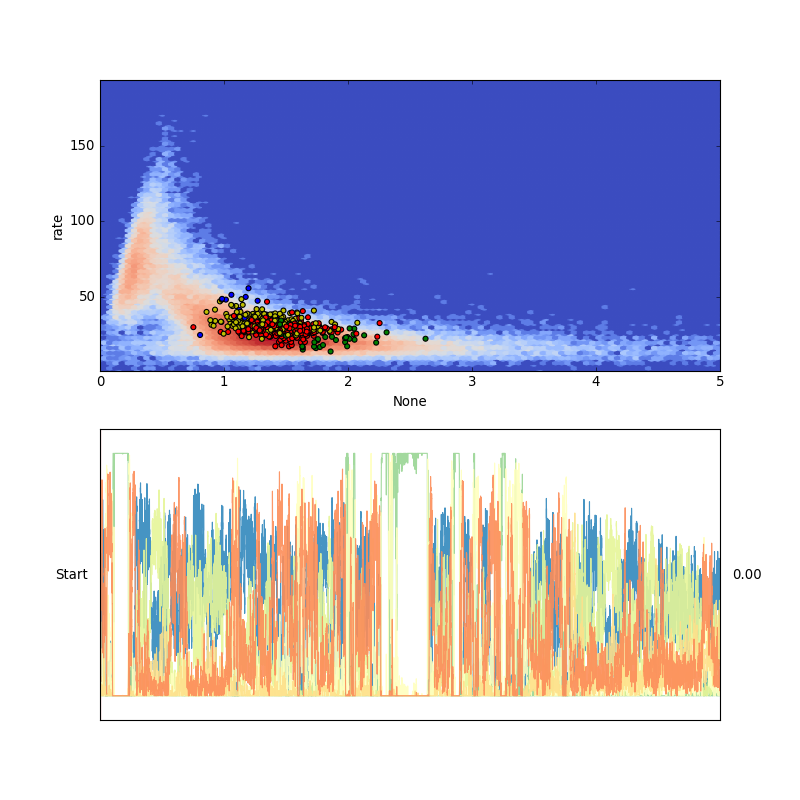

In [19]:
# plot the probas:

delta = 10
window = 100
cm = ListedColormap(['r', 'g', 'b', 'y'])

fig, axes = plt.subplots(2, 1, figsize=(10, 10))

ax = axes[0]
tmp = data.rateC / data.rateA
ind = (tmp < 5) & (data.rate<200)
cola = tmp[ind]
colb = data.rate[ind]

chunks = float(len(cola)) / delta

ax.hexbin(cola, colb, cmap='coolwarm', bins='log') #cmap='viridis'
ax.set_xlabel('rateC/rateA')
ax.set_ylabel('rate')

#cola, colb, color = mask(cola, colb, p1=99, p2=99.99)
l = ax.scatter(cola[:5 * window], colb[:5 * window], c=preds[:5 * window], alpha=1, s=20, cmap=cm)
ax.set_xlabel(cola.name)
ax.set_ylabel(colb.name)

# axfreq = plt.axes([0.1, 0.0, 0.8, 0.03])
sfreq = Slider(axes[1], 'Start', 0, len(cola), valinit=0, facecolor=None, alpha=.1)
for prob, color in zip(probs.T, Spectral7):
    axes[1].plot(pd.Series(prob).rolling(window=50).mean(), color=color, alpha=.9, linewidth=1)

def update(val):
    start = int(sfreq.val)
    inds = range(start, start + window)
    l.set_offsets(np.c_[cola.iloc[inds], colb.iloc[inds]])
    l.set_array(preds[inds])
    plt.gcf().canvas.draw_idle()
sfreq.on_changed(update)

#ax.set_xlim(cola.min(), cola.max())
ax.set_xlim(0, 5)
ax.set_ylim(colb.min(), colb.max())

axes[1].set_ylim(-0.1, 1.1)
plt.show()

In [20]:
# gmm model selection with aic:

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate, data.rateCA]

lowest_aic = np.infty
aic = []
n_components_range = range(1, 7)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a mixture of Gaussians with EM
        gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
        gmm.fit(X)
        aic.append(gmm.aic(X))
        if aic[-1] < lowest_aic:
            lowest_aic = aic[-1]
            best_gmm = gmm
print best_gmm.covariance_type, best_gmm.n_components

preds = best_gmm.predict(X)
probs = best_gmm.predict_proba(X)

colors = [Spectral7[x] for x in preds]

p = figure(title = 'best_gmm', x_range=[0, 5])
p.circle(data.rateCA, data.rate, color=colors, radius=0.02)

show(p)

/home/nicolas/Bureau/scikit-learn/sklearn/mixture/base.py:228: ConvergenceWarning: Initialization 1 did not converged. Try different init parameters, or increase n_init, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


full 6


-833365.792443


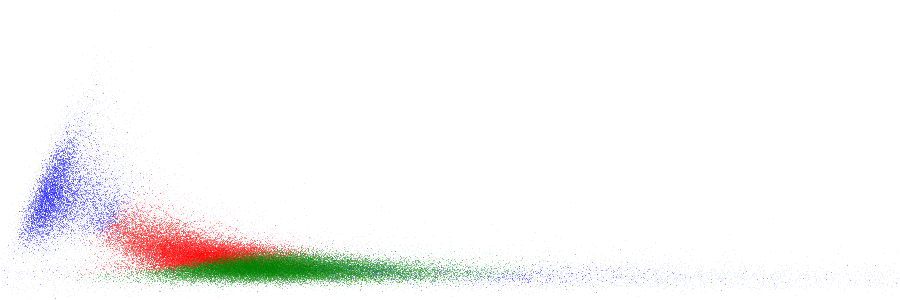

In [21]:
# Hmm with 3 components:

# looks better with data.rateCA in X
# looks like 3 is better than 4 components

from hmmlearn import hmm

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate, data.rateCA]

clf = hmm.GaussianHMM(n_components=3, covariance_type='full').fit(X)
preds = clf.predict(X)
probs = clf.predict_proba(X)

print clf.score(X)

color_key = ['red', 'green', 'blue', 'yellow']

data['preds'] = pd.Series(preds).astype("category")

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)


<IPython.core.display.Javascript object>


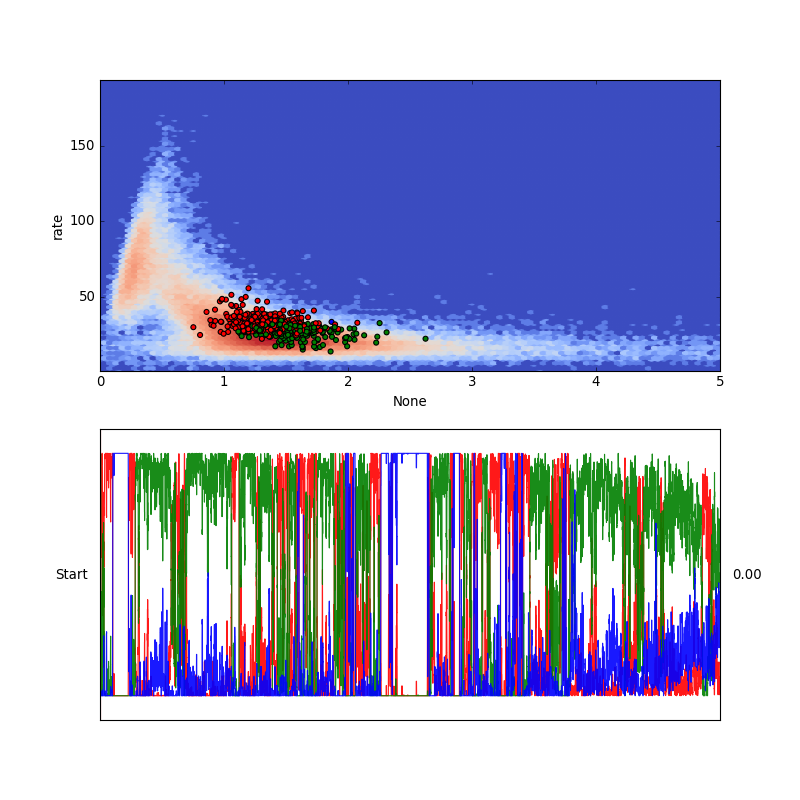

In [22]:
# plot the probas:

delta = 10
window = 100
cm = ListedColormap(['r', 'g', 'b'])  #, 'y'])

fig, axes = plt.subplots(2, 1, figsize=(10, 10))

ax = axes[0]
tmp = data.rateC / data.rateA
ind = (tmp < 5) & (data.rate<200)
cola = tmp[ind]
colb = data.rate[ind]

chunks = float(len(cola)) / delta

ax.hexbin(cola, colb, cmap='coolwarm', bins='log') #cmap='viridis'
ax.set_xlabel('rateC/rateA')
ax.set_ylabel('rate')

#cola, colb, color = mask(cola, colb, p1=99, p2=99.99)
l = ax.scatter(cola[:5 * window], colb[:5 * window], c=preds[:5 * window], alpha=1, s=20, cmap=cm)
ax.set_xlabel(cola.name)
ax.set_ylabel(colb.name)

# axfreq = plt.axes([0.1, 0.0, 0.8, 0.03])
sfreq = Slider(axes[1], 'Start', 0, len(cola), valinit=0, facecolor=None, alpha=.1)
for prob, color in zip(probs.T, ['r', 'g', 'b']): #, 'y']):
    axes[1].plot(pd.Series(prob).rolling(window=50).mean(), color=color, alpha=.9, linewidth=1)

def update(val):
    start = int(sfreq.val)
    inds = range(start, start + window)
    l.set_offsets(np.c_[cola.iloc[inds], colb.iloc[inds]])
    l.set_array(preds[inds])
    plt.gcf().canvas.draw_idle()
sfreq.on_changed(update)

#ax.set_xlim(cola.min(), cola.max())
ax.set_xlim(0, 5)
ax.set_ylim(colb.min(), colb.max())

axes[1].set_ylim(-0.1, 1.1)
plt.show()

         1    -1291292.6360             +nan
         2    -1032857.1919     +258435.4441
         3     -877928.2944     +154928.8975
         4     -808598.2952      +69329.9992
         5     -777216.0540      +31382.2412
         6     -758292.1304      +18923.9236
         7     -746993.8123      +11298.3181
         8     -740028.6232       +6965.1891
         9     -734773.1955       +5255.4277
        10     -730685.9059       +4087.2897
        11     -727436.1599       +3249.7460
        12     -724809.8864       +2626.2734
        13     -722616.4709       +2193.4156
        14     -720802.3812       +1814.0897
        15     -719413.8593       +1388.5219
        16     -718390.2326       +1023.6267
        17     -717624.5193        +765.7133
        18     -717042.5762        +581.9431
        19     -716587.6796        +454.8967
        20     -716216.7741        +370.9054
        21     -715906.3554        +310.4187
        22     -715645.9469        +260.4085
        23

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV] n_components=1 ..................................................
[CV] ................... n_components=1, score=-255561.891515 -   0.2s
[CV] n_components=1 ..................................................


         1    -1041274.5060             +nan
         2    -1041271.7881          +2.7179
         3    -1041271.7881          +0.0000
         1     -989362.3059             +nan


[CV] ................... n_components=1, score=-231228.742770 -   0.2s
[CV] n_components=1 ..................................................
[CV] ................... n_components=1, score=-303025.984635 -   0.2s
[CV] n_components=1 ..................................................


         2     -989359.5623          +2.7435
         3     -989359.5623          +0.0000
         1    -1023421.4028             +nan
         2    -1023418.6831          +2.7196
         3    -1023418.6831          +0.0000
         1     -983177.1988             +nan
         2     -983174.4643          +2.7345
         3     -983174.4643          +0.0000


[CV] ................... n_components=1, score=-247353.727812 -   0.2s
[CV] n_components=1 ..................................................
[CV] ................... n_components=1, score=-306528.572288 -   0.2s
[CV] n_components=2 ..................................................


         1    -1029888.0692             +nan
         2     -892477.3756     +137410.6935
         3     -785631.7973     +106845.5783
         4     -761429.1354      +24202.6619
         5     -752541.9027       +8887.2327
         6     -748735.5510       +3806.3517
         7     -746994.3718       +1741.1792
         8     -746089.5203        +904.8515
         9     -745611.2235        +478.2968
        10     -745366.8628        +244.3607
        11     -745243.9615        +122.9013
        12     -745182.0403         +61.9212
        13     -745150.5913         +31.4490
        14     -745134.4651         +16.1261
        15     -745126.1360          +8.3291
        16     -745121.8121          +4.3239
        17     -745119.5587          +2.2533
        18     -745118.3807          +1.1780
        19     -745117.7632          +0.6176
        20     -745117.4386          +0.3246
        21     -745117.2677          +0.1710
        22     -745117.1774          +0.0902
        23

[CV] ................... n_components=2, score=-173556.088753 -   3.0s
[CV] n_components=2 ..................................................


         1    -1055258.5605             +nan
         2     -917854.0212     +137404.5393
         3     -803756.1440     +114097.8773
         4     -779734.4551      +24021.6888
         5     -770259.4983       +9474.9568
         6     -766387.3187       +3872.1797
         7     -764530.8105       +1856.5082
         8     -763617.9803        +912.8301
         9     -763149.8484        +468.1320
        10     -762901.5968        +248.2516
        11     -762772.9366        +128.6602
        12     -762708.6167         +64.3199
        13     -762677.1563         +31.4604
        14     -762661.8438         +15.3125
        15     -762654.3676          +7.4762
        16     -762650.7044          +3.6632
        17     -762648.9050          +1.7993
        18     -762648.0199          +0.8852
        19     -762647.5840          +0.4359
        20     -762647.3692          +0.2148
        21     -762647.2633          +0.1059
        22     -762647.2110          +0.0523
        23

[CV] ................... n_components=2, score=-155615.232631 -   2.9s
[CV] n_components=2 ..................................................


         1    -1010840.5126             +nan
         2     -842800.8712     +168039.6414
         3     -742752.5864     +100048.2849
         4     -715666.1612      +27086.4252
         5     -705295.6117      +10370.5495
         6     -701024.8799       +4270.7318
         7     -699241.8309       +1783.0489
         8     -698411.0705        +830.7605
         9     -698014.1774        +396.8931
        10     -697826.4884        +187.6890
        11     -697737.7631         +88.7253
        12     -697695.7414         +42.0216
        13     -697675.6682         +20.0732
        14     -697665.9939          +9.6743
        15     -697661.2963          +4.6975
        16     -697659.0011          +2.2952
        17     -697657.8738          +1.1273
        18     -697657.3176          +0.5562
        19     -697657.0421          +0.2755
        20     -697656.9052          +0.1369
        21     -697656.8370          +0.0682
        22     -697656.8030          +0.0341
        23

[CV] ................... n_components=2, score=-225917.258167 -   2.9s
[CV] n_components=2 ..................................................


         1    -1038349.7167             +nan
         2     -879539.0887     +158810.6280
         3     -771648.9928     +107890.0958
         4     -748105.0070      +23543.9858
         5     -738567.8689       +9537.1382
         6     -734240.2774       +4327.5915
         7     -732270.7457       +1969.5317
         8     -731283.0704        +987.6753
         9     -730787.8372        +495.2332
        10     -730545.9909        +241.8463
        11     -730427.9617        +118.0292
        12     -730369.9068         +58.0549
        13     -730341.0638         +28.8429
        14     -730326.6376         +14.4262
        15     -730319.3990          +7.2385
        16     -730315.7619          +3.6371
        17     -730313.9330          +1.8290
        18     -730313.0126          +0.9204
        19     -730312.5490          +0.4636
        20     -730312.3153          +0.2337
        21     -730312.1974          +0.1179
        22     -730312.1378          +0.0596
        23

[CV] ................... n_components=2, score=-187440.374989 -   4.7s
[CV] n_components=2 ..................................................


         1     -996574.0175             +nan
         2     -839607.9128     +156966.1047
         3     -738783.7758     +100824.1370
         4     -720385.5307      +18398.2451
         5     -714231.0613       +6154.4694
         6     -711781.0239       +2450.0374
         7     -710676.2423       +1104.7816
         8     -710132.3386        +543.9037
         9     -709856.7713        +275.5673
        10     -709717.0265        +139.7447
        11     -709644.9955         +72.0310
        12     -709606.9988         +37.9968
        13     -709586.5893         +20.4095
        14     -709575.6873         +10.9019
        15     -709569.9774          +5.7099
        16     -709567.0455          +2.9319
        17     -709565.5627          +1.4829
        18     -709564.8204          +0.7422
        19     -709564.4514          +0.3690
        20     -709564.2687          +0.1827
        21     -709564.1786          +0.0902
        22     -709564.1341          +0.0445
        23

[CV] ................... n_components=2, score=-221626.380128 -   3.5s
[CV] n_components=3 ..................................................


         1    -1029845.9848             +nan
         2     -865383.1259     +164462.8589
         3     -766319.9532      +99063.1727
         4     -728285.3095      +38034.6437
         5     -705210.1799      +23075.1296
         6     -694396.5127      +10813.6671
         7     -687999.9730       +6396.5397
         8     -682396.8840       +5603.0890
         9     -677199.7087       +5197.1753
        10     -673956.1939       +3243.5148
        11     -672582.7354       +1373.4585
        12     -671991.0531        +591.6823
        13     -671705.6344        +285.4187
        14     -671537.9516        +167.6828
        15     -671434.8886        +103.0630
        16     -671369.4520         +65.4366
        17     -671323.7843         +45.6677
        18     -671289.0952         +34.6891
        19     -671262.1281         +26.9672
        20     -671242.7671         +19.3610
        21     -671229.7136         +13.0535
        22     -671220.7767          +8.9368
        23

[CV] ................... n_components=3, score=-156821.200894 -  10.8s
[CV] n_components=3 ..................................................


         1    -1060037.2218             +nan
         2     -892041.0641     +167996.1577
         3     -780494.7087     +111546.3554
         4     -734032.3163      +46462.3924
         5     -708951.9417      +25080.3746
         6     -689411.8315      +19540.1102
         7     -672466.7374      +16945.0941
         8     -663417.4614       +9049.2760
         9     -657608.9945       +5808.4669
        10     -655395.6702       +2213.3243
        11     -654318.1115       +1077.5587
        12     -653796.9276        +521.1839
        13     -653541.5802        +255.3474
        14     -653415.7049        +125.8753
        15     -653352.4577         +63.2472
        16     -653319.9859         +32.4718
        17     -653302.6943         +17.2916
        18     -653293.0062          +9.6881
        19     -653287.2873          +5.7189
        20     -653283.7584          +3.5289
        21     -653281.5079          +2.2505
        22     -653280.0409          +1.4670
        23

[CV] ................... n_components=3, score=-142152.900087 -   7.8s
[CV] n_components=3 ..................................................


         1    -1000866.8072             +nan
         2     -818469.1310     +182397.6762
         3     -722388.5747      +96080.5563
         4     -681918.1986      +40470.3761
         5     -658465.1293      +23453.0693
         6     -646349.3715      +12115.7578
         7     -639744.6253       +6604.7463
         8     -635393.1427       +4351.4825
         9     -632149.3508       +3243.7919
        10     -629549.1624       +2600.1884
        11     -627220.4172       +2328.7452
        12     -625011.3105       +2209.1067
        13     -623256.6225       +1754.6880
        14     -622213.9065       +1042.7160
        15     -621667.3783        +546.5282
        16     -621373.6599        +293.7184
        17     -621214.1648        +159.4951
        18     -621121.8157         +92.3491
        19     -621065.9318         +55.8839
        20     -621030.3832         +35.5487
        21     -621006.6299         +23.7533
        22     -620990.2944         +16.3355
        23

[CV] ................... n_components=3, score=-211509.765001 -  10.7s
[CV] n_components=3 ..................................................


         1    -1040038.5417             +nan
         2     -861756.0397     +178282.5021
         3     -751238.9110     +110517.1286
         4     -710527.5552      +40711.3559
         5     -694102.6519      +16424.9033
         6     -686277.3597       +7825.2922
         7     -682155.6124       +4121.7472
         8     -679852.8652       +2302.7472
         9     -678292.7067       +1560.1585
        10     -676887.3608       +1405.3459
        11     -675515.4554       +1371.9053
        12     -674348.1255       +1167.3299
        13     -673362.2492        +985.8764
        14     -672428.4497        +933.7995
        15     -671505.1410        +923.3087
        16     -670580.8333        +924.3077
        17     -669648.4404        +932.3929
        18     -668698.6947        +949.7457
        19     -667607.1664       +1091.5283
        20     -666231.7040       +1375.4625
        21     -664462.6000       +1769.1040
        22     -662890.2219       +1572.3781
        23

[CV] ................... n_components=3, score=-166055.856609 -  10.6s
[CV] n_components=3 ..................................................


         1     -998468.7264             +nan
         2     -821872.1274     +176596.5990
         3     -720016.5164     +101855.6110
         4     -684577.7081      +35438.8084
         5     -666656.3559      +17921.3522
         6     -655972.4236      +10683.9323
         7     -649020.4849       +6951.9387
         8     -645438.8614       +3581.6235
         9     -643941.9060       +1496.9554
        10     -642770.7393       +1171.1667
        11     -641574.1946       +1196.5447
        12     -640466.9751       +1107.2195
        13     -639510.1511        +956.8240
        14     -638749.8414        +760.3097
        15     -638172.4927        +577.3487
        16     -637706.2908        +466.2019
        17     -637364.4687        +341.8221
        18     -637120.3738        +244.0949
        19     -636944.3230        +176.0508
        20     -636810.0568        +134.2662
        21     -636692.9347        +117.1221
        22     -636579.8763        +113.0583
        23

[CV] ................... n_components=3, score=-205739.178859 -  10.7s
[CV] n_components=4 ..................................................


         1    -1031837.8034             +nan
         2     -836076.6821     +195761.1213
         3     -709674.0787     +126402.6034
         4     -652110.3268      +57563.7518
         5     -630927.8475      +21182.4793
         6     -617499.5214      +13428.3261
         7     -608963.0211       +8536.5003
         8     -603673.7565       +5289.2646
         9     -599626.7601       +4046.9964
        10     -596194.1598       +3432.6003
        11     -593505.6268       +2688.5329
        12     -591546.4557       +1959.1711
        13     -590127.2680       +1419.1877
        14     -588994.6579       +1132.6101
        15     -588025.9258        +968.7321
        16     -587146.5256        +879.4002
        17     -586318.3706        +828.1550
        18     -585552.3540        +766.0166
        19     -584859.1284        +693.2256
        20     -584243.2169        +615.9115
        21     -583706.5609        +536.6560
        22     -583235.0578        +471.5030
        23

[CV] ................... n_components=4, score=-137299.641809 -  16.8s
[CV] n_components=4 ..................................................


         1    -1056277.9002             +nan
         2     -857330.0074     +198947.8928
         3     -724918.1466     +132411.8608
         4     -663373.2184      +61544.9282
         5     -641221.5577      +22151.6608
         6     -627377.2094      +13844.3483
         7     -619058.5024       +8318.7070
         8     -613760.4468       +5298.0556
         9     -609716.9818       +4043.4650
        10     -606500.9445       +3216.0373
        11     -603902.7909       +2598.1536
        12     -601748.5777       +2154.2131
        13     -599951.1862       +1797.3915
        14     -598467.0834       +1484.1029
        15     -597222.1802       +1244.9031
        16     -596183.5738       +1038.6065
        17     -595366.2376        +817.3361
        18     -594758.1833        +608.0543
        19     -594304.3510        +453.8324
        20     -593955.8696        +348.4814
        21     -593680.3265        +275.5431
        22     -593457.5932        +222.7333
        23

[CV] ................... n_components=4, score=-124321.068037 -  16.9s
[CV] n_components=4 ..................................................


         1    -1005449.6222             +nan
         2     -806933.3643     +198516.2579
         3     -697263.1194     +109670.2449
         4     -640764.0775      +56499.0419
         5     -609160.7703      +31603.3072
         6     -595777.9285      +13382.8418
         7     -589862.8990       +5915.0295
         8     -586400.4808       +3462.4182
         9     -583929.3058       +2471.1750
        10     -582056.8914       +1872.4144
        11     -580481.7282       +1575.1632
        12     -579092.4535       +1389.2747
        13     -578012.2273       +1080.2262
        14     -577225.9589        +786.2684
        15     -576699.4316        +526.5273
        16     -576331.2712        +368.1605
        17     -576062.2818        +268.9894
        18     -575858.3903        +203.8914
        19     -575701.9335        +156.4569
        20     -575581.6822        +120.2512
        21     -575486.7131         +94.9691
        22     -575409.8158         +76.8973
        23

[CV] ................... n_components=4, score=-202212.360450 -  16.8s
[CV] n_components=4 ..................................................


         1    -1039663.8781             +nan
         2     -824850.2628     +214813.6153
         3     -698045.5676     +126804.6952
         4     -640607.2923      +57438.2753
         5     -616851.7787      +23755.5137
         6     -600822.2507      +16029.5280
         7     -591234.7775       +9587.4732
         8     -585251.0824       +5983.6950
         9     -581175.2869       +4075.7956
        10     -578094.1347       +3081.1521
        11     -575738.9390       +2355.1958
        12     -573862.5297       +1876.4092
        13     -572364.2087       +1498.3210
        14     -571194.4288       +1169.7799
        15     -570308.4678        +885.9610
        16     -569695.8424        +612.6254
        17     -569290.0928        +405.7496
        18     -569024.7160        +265.3767
        19     -568851.1009        +173.6151
        20     -568733.2435        +117.8574
        21     -568648.6329         +84.6106
        22     -568584.9147         +63.7182
        23

[CV] ................... n_components=4, score=-148050.495963 -  16.8s
[CV] n_components=4 ..................................................


         1     -998032.3569             +nan
         2     -782343.9185     +215688.4384
         3     -667337.7178     +115006.2006
         4     -617596.5742      +49741.1436
         5     -588793.5118      +28803.0624
         6     -573310.4911      +15483.0207
         7     -564166.1976       +9144.2935
         8     -558267.6047       +5898.5929
         9     -554003.2333       +4264.3714
        10     -550644.9338       +3358.2995
        11     -547951.5553       +2693.3785
        12     -545868.9798       +2082.5754
        13     -544394.4331       +1474.5467
        14     -543401.5860        +992.8471
        15     -542708.0288        +693.5572
        16     -542209.3779        +498.6509
        17     -541839.7938        +369.5841
        18     -541553.8027        +285.9911
        19     -541327.5270        +226.2757
        20     -541145.7854        +181.7416
        21     -540995.6609        +150.1245
        22     -540875.1906        +120.4702
        23

[CV] ................... n_components=4, score=-195106.043205 -  17.1s
[CV] n_components=5 ..................................................


         1    -1030259.2891             +nan
         2     -825785.2812     +204474.0079
         3     -690260.8489     +135524.4323
         4     -625465.6602      +64795.1887
         5     -588641.4606      +36824.1995
         6     -566552.7512      +22088.7094
         7     -558804.0787       +7748.6726
         8     -555476.1551       +3327.9235
         9     -553251.8086       +2224.3465
        10     -551542.2804       +1709.5282
        11     -550238.4119       +1303.8685
        12     -549251.3608        +987.0512
        13     -548480.1908        +771.1700
        14     -547901.6773        +578.5134
        15     -547447.6339        +454.0434
        16     -547068.0929        +379.5410
        17     -546735.3247        +332.7682
        18     -546428.7672        +306.5575
        19     -546142.7765        +285.9907
        20     -545879.0613        +263.7152
        21     -545641.1390        +237.9223
        22     -545432.5324        +208.6066
        23

[CV] ................... n_components=5, score=-128134.060321 -  25.3s
[CV] n_components=5 ..................................................


         1    -1044766.5023             +nan
         2     -829786.6959     +214979.8064
         3     -714561.5166     +115225.1793
         4     -667353.6791      +47207.8375
         5     -634906.5491      +32447.1301
         6     -606425.0835      +28481.4656
         7     -585492.7303      +20932.3532
         8     -572907.9493      +12584.7810
         9     -564965.5963       +7942.3530
        10     -560158.0900       +4807.5063
        11     -557284.8818       +2873.2082
        12     -555338.7559       +1946.1259
        13     -554079.1784       +1259.5774
        14     -553297.6614        +781.5171
        15     -552781.4039        +516.2574
        16     -552415.0850        +366.3189
        17     -552140.8552        +274.2298
        18     -551929.1905        +211.6647
        19     -551754.8806        +174.3099
        20     -551618.0227        +136.8579
        21     -551511.1538        +106.8689
        22     -551425.7854         +85.3684
        23

[CV] ................... n_components=5, score=-115587.473044 -  25.2s
[CV] n_components=5 ..................................................


         1     -994464.9428             +nan
         2     -777839.9762     +216624.9666
         3     -671601.4680     +106238.5082
         4     -615183.9727      +56417.4953
         5     -580881.7510      +34302.2217
         6     -561376.5614      +19505.1896
         7     -549464.3573      +11912.2041
         8     -542097.5445       +7366.8128
         9     -536728.8305       +5368.7140
        10     -532466.1065       +4262.7240
        11     -529158.2839       +3307.8227
        12     -526724.2476       +2434.0363
        13     -525134.8374       +1589.4102
        14     -524172.3760        +962.4613
        15     -523564.3726        +608.0034
        16     -523145.3739        +418.9987
        17     -522845.8909        +299.4830
        18     -522623.9899        +221.9011
        19     -522453.3553        +170.6346
        20     -522319.1502        +134.2051
        21     -522211.7741        +107.3761
        22     -522124.8229         +86.9511
        23

[CV] ................... n_components=5, score=-149421.016187 -  24.9s
[CV] n_components=5 ..................................................


         1    -1038546.1614             +nan
         2     -818323.9943     +220222.1671
         3     -671211.0950     +147112.8993
         4     -604303.9864      +66907.1086
         5     -579908.5878      +24395.3986
         6     -567442.4586      +12466.1292
         7     -559748.0439       +7694.4147
         8     -553840.5597       +5907.4842
         9     -549056.1255       +4784.4342
        10     -545202.7742       +3853.3512
        11     -542052.1910       +3150.5832
        12     -539594.2408       +2457.9502
        13     -537644.7612       +1949.4796
        14     -535993.9696       +1650.7915
        15     -534705.6163       +1288.3533
        16     -533757.1407        +948.4756
        17     -533116.9639        +640.1768
        18     -532721.0501        +395.9138
        19     -532454.9597        +266.0904
        20     -532252.1548        +202.8049
        21     -532088.8410        +163.3138
        22     -531952.2136        +136.6274
        23

[CV] ................... n_components=5, score=-139878.773311 -  25.8s
[CV] n_components=5 ..................................................


         1     -997855.2053             +nan
         2     -774080.1665     +223775.0388
         3     -646851.8088     +127228.3577
         4     -586417.5336      +60434.2751
         5     -559870.7749      +26546.7588
         6     -542340.1481      +17530.6267
         7     -530702.0913      +11638.0569
         8     -522383.6830       +8318.4083
         9     -516705.7906       +5677.8923
        10     -513398.3943       +3307.3963
        11     -511284.0892       +2114.3051
        12     -509800.7518       +1483.3375
        13     -508849.2525        +951.4992
        14     -508178.8860        +670.3665
        15     -507624.6549        +554.2311
        16     -507152.3243        +472.3305
        17     -506744.4969        +407.8275
        18     -506397.3740        +347.1229
        19     -506108.8273        +288.5467
        20     -505863.0458        +245.7814
        21     -505641.5376        +221.5082
        22     -505430.8215        +210.7161
        23

[CV] ................... n_components=5, score=-183252.531361 -  25.6s
[CV] n_components=6 ..................................................


         1    -1016458.0127             +nan
         2     -811806.7378     +204651.2750
         3     -693698.4759     +118108.2619
         4     -631123.1935      +62575.2825
         5     -593242.8206      +37880.3729
         6     -570059.0990      +23183.7216
         7     -554982.7845      +15076.3145
         8     -545266.6281       +9716.1564
         9     -538871.5100       +6395.1181
        10     -534356.7758       +4514.7342
        11     -530475.2542       +3881.5217
        12     -527196.2102       +3279.0440
        13     -524529.0602       +2667.1500
        14     -522614.4799       +1914.5802
        15     -521230.5349       +1383.9450
        16     -520187.8238       +1042.7111
        17     -519341.1466        +846.6771
        18     -518647.3242        +693.8224
        19     -518102.6986        +544.6256
        20     -517657.2010        +445.4977
        21     -517328.4304        +328.7706
        22     -517068.6898        +259.7406
        23

[CV] ................... n_components=6, score=-119695.759856 -  34.9s
[CV] n_components=6 ..................................................


         1    -1041789.7063             +nan
         2     -827620.4526     +214169.2537
         3     -704276.0777     +123344.3749
         4     -646302.7474      +57973.3303
         5     -606181.7123      +40121.0351
         6     -580078.1064      +26103.6059
         7     -565103.4186      +14974.6878
         8     -555412.1242       +9691.2943
         9     -548903.2162       +6508.9080
        10     -543675.6364       +5227.5798
        11     -539555.8163       +4119.8201
        12     -536352.9211       +3202.8951
        13     -534078.2870       +2274.6341
        14     -532580.0904       +1498.1966
        15     -531529.1003       +1050.9901
        16     -530631.0969        +898.0034
        17     -529701.7566        +929.3403
        18     -528897.5295        +804.2271
        19     -528255.3996        +642.1299
        20     -527736.2026        +519.1969
        21     -527316.3964        +419.8062
        22     -526963.8738        +352.5227
        23

[CV] ................... n_components=6, score=-108816.260071 -  34.9s
[CV] n_components=6 ..................................................


         1     -993618.0537             +nan
         2     -772607.3136     +221010.7400
         3     -656624.2707     +115983.0430
         4     -582834.9944      +73789.2763
         5     -551129.9990      +31704.9954
         6     -539122.2571      +12007.7419
         7     -531805.4548       +7316.8022
         8     -526116.0548       +5689.4001
         9     -521527.9185       +4588.1362
        10     -517951.0419       +3576.8766
        11     -515100.4575       +2850.5845
        12     -512916.0545       +2184.4030
        13     -511251.9694       +1664.0851
        14     -509955.2714       +1296.6980
        15     -508930.9659       +1024.3055
        16     -508141.1516        +789.8143
        17     -507540.2401        +600.9115
        18     -507087.3062        +452.9339
        19     -506726.8311        +360.4751
        20     -506429.9078        +296.9233
        21     -506182.2189        +247.6888
        22     -505979.6739        +202.5451
        23

[CV] ................... n_components=6, score=-147401.100806 -  36.1s
[CV] n_components=6 ..................................................


         1    -1023732.5865             +nan
         2     -818946.7331     +204785.8534
         3     -688471.2935     +130475.4396
         4     -607900.4671      +80570.8263
         5     -584371.8573      +23528.6099
         6     -575808.5900       +8563.2673
         7     -570916.5001       +4892.0899
         8     -566837.8442       +4078.6559
         9     -563377.2043       +3460.6399
        10     -560337.2955       +3039.9088
        11     -557405.1799       +2932.1156
        12     -554139.1903       +3265.9896
        13     -550803.7509       +3335.4394
        14     -547317.3232       +3486.4277
        15     -543859.5038       +3457.8194
        16     -540870.7524       +2988.7514
        17     -538263.0581       +2607.6943
        18     -535991.8326       +2271.2255
        19     -534141.6526       +1850.1800
        20     -532731.8483       +1409.8043
        21     -531619.3186       +1112.5297
        22     -530813.8393        +805.4793
        23

[CV] ................... n_components=6, score=-143645.178680 -  36.0s
[CV] n_components=6 ..................................................


         1     -999008.2478             +nan
         2     -766718.9101     +232289.3377
         3     -640430.5318     +126288.3784
         4     -582115.4396      +58315.0921
         5     -545439.6466      +36675.7930
         6     -516749.6276      +28690.0191
         7     -499972.9839      +16776.6437
         8     -492601.7508       +7371.2331
         9     -488395.4449       +4206.3059
        10     -485416.9243       +2978.5206
        11     -483280.5791       +2136.3452
        12     -481726.2627       +1554.3164
        13     -480572.6740       +1153.5887
        14     -479701.8595        +870.8145
        15     -479027.5247        +674.3348
        16     -478538.5959        +488.9287
        17     -478193.0222        +345.5737
        18     -477934.8634        +258.1588
        19     -477735.6657        +199.1977
        20     -477577.3862        +158.2794
        21     -477446.7375        +130.6487
        22     -477333.7011        +113.0365
        23

[CV] ................... n_components=6, score=-173254.745260 -  37.8s
[CV] n_components=7 ..................................................


         1    -1014719.0582             +nan
         2     -807581.9349     +207137.1232
         3     -678920.2010     +128661.7340
         4     -608985.9794      +69934.2215
         5     -560640.6058      +48345.3736
         6     -541476.0316      +19164.5742
         7     -532156.1777       +9319.8540
         8     -526613.2965       +5542.8812
         9     -522826.7776       +3786.5189
        10     -519714.8138       +3111.9638
        11     -517134.3980       +2580.4159
        12     -515090.1578       +2044.2401
        13     -513425.8060       +1664.3518
        14     -512001.3684       +1424.4377
        15     -510755.2199       +1246.1485
        16     -509671.2217       +1083.9982
        17     -508729.9478        +941.2738
        18     -507869.6477        +860.3002
        19     -507011.3796        +858.2681
        20     -506201.5059        +809.8737
        21     -505522.4193        +679.0866
        22     -504923.3405        +599.0787
        23

[CV] ................... n_components=7, score=-115893.359765 -  49.3s
[CV] n_components=7 ..................................................


         1    -1040272.1751             +nan
         2     -823941.2799     +216330.8953
         3     -697853.4848     +126087.7950
         4     -630468.3482      +67385.1367
         5     -586506.3367      +43962.0115
         6     -556326.3667      +30179.9700
         7     -542338.0255      +13988.3412
         8     -536412.4501       +5925.5754
         9     -532375.4615       +4036.9886
        10     -529411.7065       +2963.7550
        11     -526962.5354       +2449.1711
        12     -524737.9363       +2224.5991
        13     -522875.4132       +1862.5231
        14     -521367.4504       +1507.9629
        15     -520201.3597       +1166.0907
        16     -519299.2471        +902.1125
        17     -518537.8235        +761.4236
        18     -517812.6960        +725.1276
        19     -517170.9863        +641.7097
        20     -516563.3305        +607.6558
        21     -515989.2933        +574.0372
        22     -515353.3398        +635.9536
        23

[CV] ................... n_components=7, score=-104292.548648 -  52.8s
[CV] n_components=7 ..................................................


         1     -989788.3509             +nan
         2     -770483.9101     +219304.4407
         3     -653238.7891     +117245.1211
         4     -571761.7536      +81477.0355
         5     -529035.9864      +42725.7672
         6     -514301.9507      +14734.0357
         7     -506961.8523       +7340.0985
         8     -502181.3966       +4780.4557
         9     -498560.7773       +3620.6193
        10     -495538.2198       +3022.5576
        11     -492968.6384       +2569.5814
        12     -490879.0631       +2089.5753
        13     -489197.7691       +1681.2940
        14     -487829.2461       +1368.5230
        15     -486699.6264       +1129.6197
        16     -485776.8458        +922.7806
        17     -485024.7135        +752.1323
        18     -484384.4366        +640.2768
        19     -483831.2313        +553.2054
        20     -483370.3627        +460.8686
        21     -482969.2946        +401.0680
        22     -482602.6152        +366.6794
        23

[CV] ................... n_components=7, score=-138978.718701 -  45.2s
[CV] n_components=7 ..................................................


         1    -1022151.5626             +nan
         2     -809633.2991     +212518.2635
         3     -671032.2891     +138601.0100
         4     -597816.5683      +73215.7208
         5     -561723.1589      +36093.4094
         6     -545291.8963      +16431.2626
         7     -538965.2466       +6326.6497
         8     -535259.9783       +3705.2683
         9     -532545.7700       +2714.2084
        10     -530299.7826       +2245.9874
        11     -528214.8936       +2084.8890
        12     -526096.4841       +2118.4095
        13     -523711.7626       +2384.7215
        14     -521291.3309       +2420.4317
        15     -519117.2555       +2174.0754
        16     -517361.7815       +1755.4740
        17     -516003.3876       +1358.3939
        18     -514866.7008       +1136.6868
        19     -513901.3352        +965.3656
        20     -513124.6604        +776.6748
        21     -512466.3424        +658.3180
        22     -511872.0381        +594.3043
        23

[CV] ................... n_components=7, score=-135742.360614 -  48.3s
[CV] n_components=7 ..................................................


         1     -985767.9644             +nan
         2     -770542.5794     +215225.3850
         3     -649176.1680     +121366.4114
         4     -583822.8152      +65353.3529
         5     -552449.6577      +31373.1575
         6     -531084.3354      +21365.3222
         7     -516367.6298      +14716.7056
         8     -508980.3371       +7387.2927
         9     -504827.3370       +4153.0001
        10     -502083.5367       +2743.8003
        11     -500061.0962       +2022.4406
        12     -498555.8584       +1505.2377
        13     -497313.3740       +1242.4845
        14     -496147.9141       +1165.4599
        15     -495134.9973       +1012.9168
        16     -494208.7207        +926.2766
        17     -493340.2471        +868.4736
        18     -492556.7617        +783.4854
        19     -491796.7582        +760.0036
        20     -490963.0972        +833.6610
        21     -489995.8115        +967.2857
        22     -488862.3999       +1133.4115
        23

[CV] ................... n_components=7, score=-181144.746965 -  51.2s


         1    -1269720.5745             +nan
         2     -996310.5157     +273410.0588
         3     -838947.9055     +157362.6103
         4     -748405.5804      +90542.3251
         5     -689605.7945      +58799.7859
         6     -664013.0996      +25592.6949
         7     -653370.3116      +10642.7880
         8     -646898.6635       +6471.6480
         9     -642091.0170       +4807.6465
        10     -638050.0157       +4041.0014
        11     -634681.2454       +3368.7703
        12     -631930.4491       +2750.7962
        13     -629637.4885       +2292.9606
        14     -627696.9116       +1940.5770
        15     -626017.3299       +1679.5816
        16     -624587.3162       +1430.0137
        17     -623371.9536       +1215.3626
        18     -622247.7028       +1124.2507
        19     -621200.7971       +1046.9058
        20     -620274.7605        +926.0365
        21     -619462.2793        +812.4813
        22     -618724.9794        +737.2998
        23

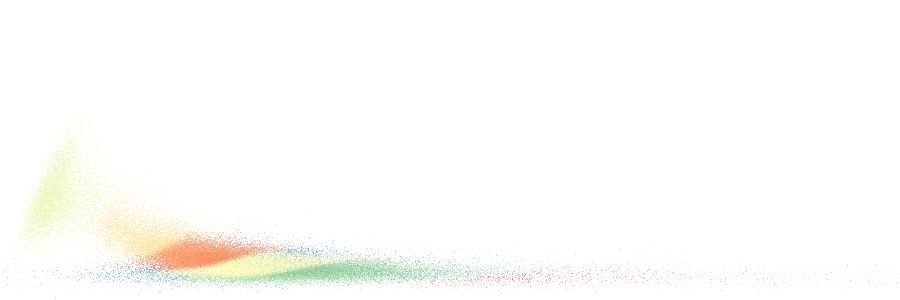

In [23]:
# CV on HMM:
from bokeh.palettes import Spectral7
from sklearn.model_selection import GridSearchCV

param_grid = {'n_components': [1, 2, 3, 4, 5, 6, 7]}

X = np.c_[data.orbit, data.rateA, data.rateB, data.rateC, data.rate, data.rateCA]

model = hmm.GaussianHMM(n_components=4, verbose=10, n_iter=50, random_state=0, covariance_type="full").fit(X)
grid = GridSearchCV(model, param_grid, cv=5, verbose=3).fit(X)

hmmCV = grid.best_estimator_.fit(X)
preds = hmmCV.predict(X)
probs = hmmCV.predict_proba(X)

color_key = Spectral7

data['preds'] = pd.Series(preds).astype("category")

cvs = ds.Canvas(plot_height=300, plot_width=900, x_range=[0, 5], y_range=[0, 200])

agg = cvs.points(data, 'rateCA', 'rate', ds.count_cat('preds'))

tf.colorize(agg, color_key)

full 7


<IPython.core.display.Javascript object>


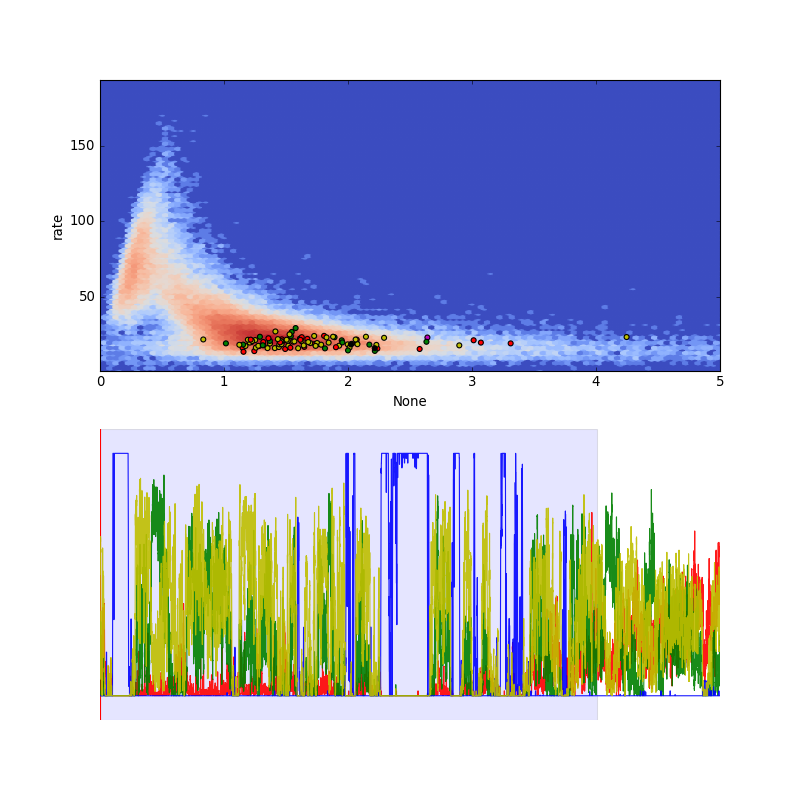

In [24]:
# plot the probas:
print hmmCV.covariance_type, hmmCV.n_components

delta = 10
window = 100
cm = ListedColormap(['r', 'g', 'b', 'y', 'c', 'k', 'm'])

fig, axes = plt.subplots(2, 1, figsize=(10, 10))

ax = axes[0]
tmp = data.rateC / data.rateA
ind = (tmp < 5) & (data.rate<200)
cola = tmp[ind]
colb = data.rate[ind]

chunks = float(len(cola)) / delta

ax.hexbin(cola, colb, cmap='coolwarm', bins='log')
ax.set_xlabel('rateC/rateA')
ax.set_ylabel('rate')

#cola, colb, color = mask(cola, colb, p1=99, p2=99.99)
l = ax.scatter(cola[:5 * window], colb[:5 * window], c=preds[:5 * window], alpha=1, s=20, cmap=cm)
ax.set_xlabel(cola.name)
ax.set_ylabel(colb.name)

# axfreq = plt.axes([0.1, 0.0, 0.8, 0.03])
sfreq = Slider(axes[1], 'Start', 0, len(cola), valinit=0, facecolor=None, alpha=.1)
for prob, color in zip(probs.T, ['r', 'g', 'b', 'y', 'p', 'bl']):
    axes[1].plot(pd.Series(prob).rolling(window=50).mean(), color=color, alpha=.9, linewidth=1)

def update(val):
    start = int(sfreq.val)
    inds = range(start, start + window)
    l.set_offsets(np.c_[cola.iloc[inds], colb.iloc[inds]])
    l.set_array(preds[inds])
    plt.gcf().canvas.draw_idle()
sfreq.on_changed(update)

#ax.set_xlim(cola.min(), cola.max())
ax.set_xlim(0, 5)
ax.set_ylim(colb.min(), colb.max())

axes[1].set_ylim(-0.1, 1.1)
plt.show()